In [ ]:
# Data loading

# Step 1: Install required packages
!pip install mne
!pip install mne mne-icalabel --quiet

from google.colab import files
import os
import zipfile
import mne
import shutil
import mne
from mne.preprocessing import ICA
from mne_icalabel import label_components
from mne.channels import make_standard_montage
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np

print(" Please upload your .zip file or individual .edf files...")
uploaded = files.upload()

# Step 3: Handle uploads (extract ZIP or move EDFs)
upload_dir = "/content/edf_data"
os.makedirs(upload_dir, exist_ok=True)

for filename in uploaded.keys():
    if filename.endswith('.zip'):
        with zipfile.ZipFile(filename, 'r') as zip_ref:
            zip_ref.extractall(upload_dir)
    elif filename.endswith('.edf'):
        os.rename(filename, os.path.join(upload_dir, filename))

# Step 4: Preprocess EDF files (Raw and Filtered)

output_dir = "/content/processed_eeg"
os.makedirs(output_dir, exist_ok=True)

edf_files = [f for f in os.listdir(upload_dir) if f.endswith('.edf')]

for edf_file in edf_files:
    subject_id = edf_file.replace(".edf", "")
    print(f" Processing {subject_id}")

    raw = mne.io.read_raw_edf(os.path.join(upload_dir, edf_file), preload=True)
    raw.set_montage("standard_1020", on_missing='ignore')

    # Save raw data
    raw.save(os.path.join(output_dir, f"{subject_id}_raw.fif"), overwrite=True)

    # Bandpass filter (1–50 Hz)
    raw_filt = raw.copy().filter(1., 50.)
    raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)

print(" Preprocessing complete. Files saved to:", output_dir)

# Step 5: Zip and download all .fif files

shutil.make_archive('/content/processed_eeg', 'zip', '/content/processed_eeg')

files.download('/content/processed_eeg.zip')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 19.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.6/21.6 MB 29.9 MB/s eta 0:00:00
 Please upload your .zip file or individual .edf files...


Saving 001 (9).zip to 001 (9).zip
 Processing 001 (20)
Extracting EDF parameters from /content/edf_data/001 (20).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 38783  =      0.000 ...   302.992 secs...
Writing /content/processed_eeg/001 (20)_raw.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (20)_raw.fif
[done]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

Wr

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.1s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (20)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)


Writing /content/processed_eeg/001 (13)_filtered.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (13)_filtered.fif
[done]
 Processing 001 (4)
Extracting EDF parameters from /content/edf_data/001 (4).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 13311  =      0.000 ...   103.992 secs...
Writing /content/processed_eeg/001 (4)_raw.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (4)_raw.fif
[done]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  29 out of  29 | elapsed:    0.0s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (13)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.0s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (4)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _

Writing /content/processed_eeg/001 (2)_raw.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (2)_raw.fif
[done]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

Writing /content/processed_eeg/001 (2)_filtered.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (2)_filtered.fif
[done]
 Processing 001 (10)
Extracting EDF parameters from /content/edf_data/001 (10

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.1s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (2)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)


Closing /content/processed_eeg/001 (10)_raw.fif
[done]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

Writing /content/processed_eeg/001 (10)_filtered.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (10)_filtered.fif
[done]
 Processing 001 (1)
Extracting EDF parameters from /content/edf_data/001 (1).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19071  =      0

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.1s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (10)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Writing /content/processed_eeg/001 (1)_filtered.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (1)_filtered.fif
[done]
 Processing 001 (15)
Extracting EDF parameters from /content/edf_data/001 (15).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 31999  =      0.000 ...   249.992 secs...
Writing /content/processed_eeg/001 (15)_raw.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (15)_raw.fif
[done]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 

[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.0s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (1)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Writing /content/processed_eeg/001 (15)_filtered.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (15)_filtered.fif
[done]
 Processing 001 (16)
Extracting EDF parameters from /content/edf_data/001 (16).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 42495  =      0.000 ...   331.992 secs...
Writing /content/processed_eeg/001 (16)_raw.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (16)_raw.fif
[done]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.5

[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.1s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (15)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)


Writing /content/processed_eeg/001 (16)_filtered.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (16)_filtered.fif
[done]
 Processing 001 (7)
Extracting EDF parameters from /content/edf_data/001 (7).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 38527  =      0.000 ...   300.992 secs...
Writing /content/processed_eeg/001 (7)_raw.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (7)_raw.fif
[done]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.1s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (16)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)


- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

Writing /content/processed_eeg/001 (7)_filtered.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (7)_filtered.fif
[done]
 Processing 001 (18)
Extracting EDF parameters from /content/edf_data/001 (18).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 32767  =      0.000 ...   255.992 secs...
Writing /content/processed_eeg/001 (18)_raw.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (18)_raw.fif
[done]


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.1s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (7)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

Writing /content/processed_eeg/001 (18)_filtered.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (18)_filtered.fif
[done]
 Processing 001 (17)
Extracting EDF parameters from /content/edf_data/001 (17).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 38783  =      0.000 ...   302.992 secs...
Writing /content/processed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.1s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (18)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)


- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

Writing /content/processed_eeg/001 (17)_filtered.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (17)_filtered.fif
[done]
 Processing 001 (19)
Extracting EDF parameters from /content/edf_data/001 (19).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 25727  =      0.000 ...   200.992 secs...
Writing /content/processed_eeg/001 (19)_raw.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (19)_raw.fif
[done]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.1s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (17)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)


Writing /content/processed_eeg/001 (19)_filtered.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (19)_filtered.fif
[done]
 Processing 001 (6)
Extracting EDF parameters from /content/edf_data/001 (6).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 26879  =      0.000 ...   209.992 secs...
Writing /content/processed_eeg/001 (6)_raw.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (6)_raw.fif


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.1s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (19)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)


[done]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

Writing /content/processed_eeg/001 (6)_filtered.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (6)_filtered.fif
[done]
 Processing 001 (5)
Extracting EDF parameters from /content/edf_data/001 (5).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 38655  =      0.000 ...   301.992 secs...
Writing /content/proces

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.1s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (6)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Writing /content/processed_eeg/001 (5)_filtered.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (5)_filtered.fif
[done]
 Processing 001 (14)
Extracting EDF parameters from /content/edf_data/001 (14).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 23679  =      0.000 ...   184.992 secs...
Writing /content/processed_eeg/001 (14)_raw.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (14)_raw.fif
[done]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 

[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.1s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (5)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  29 out of  29 | elapsed:    0.0s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (14)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(outpu

Closing /content/processed_eeg/001 (14)_filtered.fif
[done]
 Processing 001 (9)
Extracting EDF parameters from /content/edf_data/001 (9).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 33663  =      0.000 ...   262.992 secs...
Writing /content/processed_eeg/001 (9)_raw.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (9)_raw.fif
[done]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.1s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (9)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)


Writing /content/processed_eeg/001 (12)_filtered.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (12)_filtered.fif
[done]
 Processing 001 (3)
Extracting EDF parameters from /content/edf_data/001 (3).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 8447  =      0.000 ...    65.992 secs...
Writing /content/processed_eeg/001 (3)_raw.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (3)_raw.fif
[done]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.1s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (12)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.0s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (3)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _

Closing /content/processed_eeg/001 (3)_filtered.fif
[done]
 Processing 001 (8)
Extracting EDF parameters from /content/edf_data/001 (8).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 28031  =      0.000 ...   218.992 secs...
Writing /content/processed_eeg/001 (8)_raw.fif
    Writing channel names to FIF truncated to 15 characters with remapping
Closing /content/processed_eeg/001 (8)_raw.fif
[done]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.0s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (8)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_filt.save(os.path.join(output_dir, f"{subject_id}_filtered.fif"), overwrite=True)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    0.0s finished
<ipython-input-1-1ade9cd685d0>:54: RuntimeWarning: This filename (/content/processed_eeg/001 (11)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _

Closing /content/processed_eeg/001 (11)_filtered.fif
[done]
 Preprocessing complete. Files saved to: /content/processed_eeg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Data preprocessing

# === Paths ===
input_dir = "/content/processed_eeg"
output_csv = "/content/iclabel_results.csv"
output_plot_dir = "/content/ica_plots"
os.makedirs(output_plot_dir, exist_ok=True)

# Define Emotiv EEG channels
emotiv_channels = ['AF3', 'T7', 'Pz', 'T8', 'AF4']
results = []

# === Process all .fif EEG files ===
fif_files = [f for f in os.listdir(input_dir) if f.endswith(".fif")]

for fif_file in fif_files:
    file_path = os.path.join(input_dir, fif_file)
    print(f"\n Processing: {fif_file}")

    try:
        # --- Load EEG data ---
        raw = mne.io.read_raw_fif(file_path, preload=True)
        raw.pick_channels(emotiv_channels)

        # --- Filter 1–50 Hz ---
        raw.filter(1., 50., fir_design='firwin')

        # --- Set montage and reference ---
        montage = make_standard_montage("standard_1020")
        raw.set_montage(montage, on_missing="ignore")
        raw.set_eeg_reference('average', projection=True)
        raw.apply_proj()

        # --- ICA: Fit using extended infomax ---
        ica = ICA(n_components=5, method='infomax', fit_params=dict(extended=True),
                  random_state=42, max_iter='auto')
        ica.fit(raw)

        # ===  Plot ICA topomaps ===
        fig = ica.plot_components(show=False)
        plot_filename = os.path.join(output_plot_dir, f"{fif_file.replace('.fif','')}_ica_components.png")
        fig.savefig(plot_filename, dpi=300)
        plt.close(fig)

        # --- ICLabel Classification ---
        labels = label_components(raw, ica, method="iclabel")
        label_array = labels["labels"]
        if not isinstance(label_array, list) and hasattr(label_array, "tolist"):
            label_array = label_array.tolist()

        # --- Count Component Labels ---
        label_counts = {
            "Subject": fif_file.split("_")[0],
            "Version": "Raw" if "raw" in fif_file.lower() else "Filtered"
        }
        for label_type in ['brain', 'muscle', 'eye', 'heart', 'line_noise', 'channel_noise', 'other']:
            label_counts[label_type.capitalize()] = sum(l == label_type for l in label_array)

        results.append(label_counts)

    except Exception as e:
        print(f" Error processing {fif_file}: {e}")

# === Save CSV Summary ===
df = pd.DataFrame(results)
df.to_csv(output_csv, index=False)
print("\n ICLabel classification complete. Results saved to:", output_csv)
print(f"  ICA topomap images saved to: {output_plot_dir}")


 Processing: 001 (17)_raw.fif
Opening raw data file /content/processed_eeg/001 (17)_raw.fif...
    Reading extended channel information
    Range : 0 ... 38783 =      0.000 ...   302.992 secs
Ready.
Reading 0 ... 38783  =      0.000 ...   302.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection item

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 14.8s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.8) and smallest (2.8e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (6)_raw.fif
Opening raw data file /content/processed_eeg/001 (6)_raw.fif...
    Reading extended channel information
    Range : 0 ... 26879 =      0.000 ...   209.992 secs
Ready.
Reading 0 ... 26879  =      0.000 ...   209.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items 

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 11.7s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.4) and smallest (8e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(raw,


 Processing: 001 (2)_raw.fif
Opening raw data file /content/processed_eeg/001 (2)_raw.fif...
    Reading extended channel information
    Range : 0 ... 51583 =      0.000 ...   402.992 secs
Ready.
Reading 0 ... 51583  =      0.000 ...   402.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items 

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 17.0s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (2.9) and smallest (4.7e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (19)_raw.fif
Opening raw data file /content/processed_eeg/001 (19)_raw.fif...
    Reading extended channel information
    Range : 0 ... 25727 =      0.000 ...   200.992 secs
Ready.
Reading 0 ... 25727  =      0.000 ...   200.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection item

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 10.3s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.9) and smallest (3.5e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (14)_filtered.fif
Opening raw data file /content/processed_eeg/001 (14)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 23679 =      0.000 ...   184.992 secs
Ready.
Reading 0 ... 23679  =      0.000 ...   184.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 proje

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (14)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 8.7s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.2) and smallest (5.6e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (17)_filtered.fif
Opening raw data file /content/processed_eeg/001 (17)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 38783 =      0.000 ...   302.992 secs
Ready.
Reading 0 ... 38783  =      0.000 ...   302.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 proje

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (17)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 24.6s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.8) and smallest (5.8e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (18)_filtered.fif
Opening raw data file /content/processed_eeg/001 (18)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 32767 =      0.000 ...   255.992 secs
Ready.
Reading 0 ... 32767  =      0.000 ...   255.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 proje

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (18)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


SSP projectors applied...
Fitting ICA to data using 5 channels (please be patient, this may take a while)
    Applying projection operator with 1 vector (pre-whitener computation)
    Applying projection operator with 1 vector (pre-whitener application)
Selecting by number: 5 components
Computing Extended Infomax ICA
    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 18.6s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (2.5) and smallest (6.3e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (18)_raw.fif
Opening raw data file /content/processed_eeg/001 (18)_raw.fif...
    Reading extended channel information
    Range : 0 ... 32767 =      0.000 ...   255.992 secs
Ready.
Reading 0 ... 32767  =      0.000 ...   255.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection item

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 6.9s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (2.6) and smallest (2.1e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (4)_filtered.fif
Opening raw data file /content/processed_eeg/001 (4)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 13311 =      0.000 ...   103.992 secs
Ready.
Reading 0 ... 13311  =      0.000 ...   103.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 project

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (4)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 7.8s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (3.7) and smallest (4e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(raw,


 Processing: 001 (4)_raw.fif
Opening raw data file /content/processed_eeg/001 (4)_raw.fif...
    Reading extended channel information
    Range : 0 ... 13311 =      0.000 ...   103.992 secs
Ready.
Reading 0 ... 13311  =      0.000 ...   103.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items 

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 9.5s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (3.6) and smallest (6.7e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (1)_filtered.fif
Opening raw data file /content/processed_eeg/001 (1)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 19071 =      0.000 ...   148.992 secs
Ready.
Reading 0 ... 19071  =      0.000 ...   148.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 project

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (1)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 8.3s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.8) and smallest (3.4e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (12)_filtered.fif
Opening raw data file /content/processed_eeg/001 (12)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 35839 =      0.000 ...   279.992 secs
Ready.
Reading 0 ... 35839  =      0.000 ...   279.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 proje

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (12)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 14.3s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (5) and smallest (6.4e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(raw,


 Processing: 001 (9)_filtered.fif
Opening raw data file /content/processed_eeg/001 (9)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 33663 =      0.000 ...   262.992 secs
Ready.
Reading 0 ... 33663  =      0.000 ...   262.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 project

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (9)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 9.9s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (3.9) and smallest (2.5e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (1)_raw.fif
Opening raw data file /content/processed_eeg/001 (1)_raw.fif...
    Reading extended channel information
    Range : 0 ... 19071 =      0.000 ...   148.992 secs
Ready.
Reading 0 ... 19071  =      0.000 ...   148.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items 

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 9.7s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.8) and smallest (4e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(raw,


 Processing: 001 (15)_filtered.fif
Opening raw data file /content/processed_eeg/001 (15)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 31999 =      0.000 ...   249.992 secs
Ready.
Reading 0 ... 31999  =      0.000 ...   249.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 proje

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (15)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 10.2s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.9) and smallest (2.8e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (15)_raw.fif
Opening raw data file /content/processed_eeg/001 (15)_raw.fif...
    Reading extended channel information
    Range : 0 ... 31999 =      0.000 ...   249.992 secs
Ready.
Reading 0 ... 31999  =      0.000 ...   249.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection item

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 5.3s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.9) and smallest (1.4e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (3)_filtered.fif
Opening raw data file /content/processed_eeg/001 (3)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 8447 =      0.000 ...    65.992 secs
Ready.
Reading 0 ... 8447  =      0.000 ...    65.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projectio

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (3)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 5.5s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (3.4) and smallest (3.9e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (8)_raw.fif
Opening raw data file /content/processed_eeg/001 (8)_raw.fif...
    Reading extended channel information
    Range : 0 ... 28031 =      0.000 ...   218.992 secs
Ready.
Reading 0 ... 28031  =      0.000 ...   218.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items 

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.4) and smallest (2.7e-31) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)


Fitting ICA took 12.6s.


<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")



 Processing: 001 (5)_filtered.fif
Opening raw data file /content/processed_eeg/001 (5)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 38655 =      0.000 ...   301.992 secs
Ready.
Reading 0 ... 38655  =      0.000 ...   301.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 project

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (5)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 11.2s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.9) and smallest (1.8e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (10)_filtered.fif
Opening raw data file /content/processed_eeg/001 (10)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 45695 =      0.000 ...   356.992 secs
Ready.
Reading 0 ... 45695  =      0.000 ...   356.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 proje

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (10)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 13.7s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (3.8) and smallest (1.6e-31) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (10)_raw.fif
Opening raw data file /content/processed_eeg/001 (10)_raw.fif...
    Reading extended channel information
    Range : 0 ... 45695 =      0.000 ...   356.992 secs
Ready.
Reading 0 ... 45695  =      0.000 ...   356.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection item

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 16.5s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (3.6) and smallest (3.8e-31) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (20)_filtered.fif
Opening raw data file /content/processed_eeg/001 (20)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 38783 =      0.000 ...   302.992 secs
Ready.
Reading 0 ... 38783  =      0.000 ...   302.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 proje

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (20)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 11.6s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (3.5) and smallest (6e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(raw,


 Processing: 001 (3)_raw.fif
Opening raw data file /content/processed_eeg/001 (3)_raw.fif...
    Reading extended channel information
    Range : 0 ... 8447 =      0.000 ...    65.992 secs
Ready.
Reading 0 ... 8447  =      0.000 ...    65.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items de

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 3.5s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (3.3) and smallest (2.2e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (16)_filtered.fif
Opening raw data file /content/processed_eeg/001 (16)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 42495 =      0.000 ...   331.992 secs
Ready.
Reading 0 ... 42495  =      0.000 ...   331.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 proje

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (16)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 14.9s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.6) and smallest (8.1e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (9)_raw.fif
Opening raw data file /content/processed_eeg/001 (9)_raw.fif...
    Reading extended channel information
    Range : 0 ... 33663 =      0.000 ...   262.992 secs
Ready.
Reading 0 ... 33663  =      0.000 ...   262.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items 

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 12.7s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.1) and smallest (1e-31) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(raw,


 Processing: 001 (13)_filtered.fif
Opening raw data file /content/processed_eeg/001 (13)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 21503 =      0.000 ...   167.992 secs
Ready.
Reading 0 ... 21503  =      0.000 ...   167.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 proje

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (13)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 8.7s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.4) and smallest (6.1e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (14)_raw.fif
Opening raw data file /content/processed_eeg/001 (14)_raw.fif...
    Reading extended channel information
    Range : 0 ... 23679 =      0.000 ...   184.992 secs
Ready.
Reading 0 ... 23679  =      0.000 ...   184.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection item

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 9.0s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.3) and smallest (2.9e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (7)_raw.fif
Opening raw data file /content/processed_eeg/001 (7)_raw.fif...
    Reading extended channel information
    Range : 0 ... 38527 =      0.000 ...   300.992 secs
Ready.
Reading 0 ... 38527  =      0.000 ...   300.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items 

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 14.9s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (2.9) and smallest (6e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(raw,


 Processing: 001 (12)_raw.fif
Opening raw data file /content/processed_eeg/001 (12)_raw.fif...
    Reading extended channel information
    Range : 0 ... 35839 =      0.000 ...   279.992 secs
Ready.
Reading 0 ... 35839  =      0.000 ...   279.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection item

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 15.2s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (5) and smallest (3.3e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(raw,


 Processing: 001 (8)_filtered.fif
Opening raw data file /content/processed_eeg/001 (8)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 28031 =      0.000 ...   218.992 secs
Ready.
Reading 0 ... 28031  =      0.000 ...   218.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 project

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (8)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 11.1s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.3) and smallest (7.6e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (16)_raw.fif
Opening raw data file /content/processed_eeg/001 (16)_raw.fif...
    Reading extended channel information
    Range : 0 ... 42495 =      0.000 ...   331.992 secs
Ready.
Reading 0 ... 42495  =      0.000 ...   331.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection item

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 15.6s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.7) and smallest (1.2e-31) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (19)_filtered.fif
Opening raw data file /content/processed_eeg/001 (19)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 25727 =      0.000 ...   200.992 secs
Ready.
Reading 0 ... 25727  =      0.000 ...   200.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 proje

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (19)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 11.2s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.9) and smallest (3.5e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (11)_raw.fif
Opening raw data file /content/processed_eeg/001 (11)_raw.fif...
    Reading extended channel information
    Range : 0 ... 15615 =      0.000 ...   121.992 secs
Ready.
Reading 0 ... 15615  =      0.000 ...   121.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection item

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 6.6s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.6) and smallest (4.7e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (20)_raw.fif
Opening raw data file /content/processed_eeg/001 (20)_raw.fif...
    Reading extended channel information
    Range : 0 ... 38783 =      0.000 ...   302.992 secs
Ready.
Reading 0 ... 38783  =      0.000 ...   302.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection item

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 17.0s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (3.6) and smallest (7.7e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (2)_filtered.fif
Opening raw data file /content/processed_eeg/001 (2)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 51583 =      0.000 ...   402.992 secs
Ready.
Reading 0 ... 51583  =      0.000 ...   402.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 project

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (2)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Selecting by number: 5 components
Computing Extended Infomax ICA
    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 18.4s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (2.9) and smallest (5.8e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (5)_raw.fif
Opening raw data file /content/processed_eeg/001 (5)_raw.fif...
    Reading extended channel information
    Range : 0 ... 38655 =      0.000 ...   301.992 secs
Ready.
Reading 0 ... 38655  =      0.000 ...   301.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items 

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 13.8s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.9) and smallest (7.5e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (7)_filtered.fif
Opening raw data file /content/processed_eeg/001 (7)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 38527 =      0.000 ...   300.992 secs
Ready.
Reading 0 ... 38527  =      0.000 ...   300.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 project

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (7)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


Computing Extended Infomax ICA
    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 16.5s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (2.9) and smallest (3.4e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (6)_filtered.fif
Opening raw data file /content/processed_eeg/001 (6)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 26879 =      0.000 ...   209.992 secs
Ready.
Reading 0 ... 26879  =      0.000 ...   209.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 project

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (6)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 11.2s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.4) and smallest (1.6e-31) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (11)_filtered.fif
Opening raw data file /content/processed_eeg/001 (11)_filtered.fif...
    Reading extended channel information
    Range : 0 ... 15615 =      0.000 ...   121.992 secs
Ready.
Reading 0 ... 15615  =      0.000 ...   121.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 proje

<ipython-input-2-0047ca93f8de>:22: RuntimeWarning: This filename (/content/processed_eeg/001 (11)_filtered.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(file_path, preload=True)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 7.1s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.5) and smallest (2.7e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 Processing: 001 (13)_raw.fif
Opening raw data file /content/processed_eeg/001 (13)_raw.fif...
    Reading extended channel information
    Range : 0 ... 21503 =      0.000 ...   167.992 secs
Ready.
Reading 0 ... 21503  =      0.000 ...   167.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection item

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 6.8s.


<ipython-input-2-0047ca93f8de>:37: RuntimeWarning: Using n_components=5 (resulting in n_components_=5) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.5) and smallest (2.9e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  labels = label_components(raw, ica, method="iclabel")
<ipython-input-2-0047ca93f8de>:46: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  labels = label_components(ra


 ICLabel classification complete. Results saved to: /content/iclabel_results.csv
  ICA topomap images saved to: /content/ica_plots


 001 (1)_filtered_ica_components.png


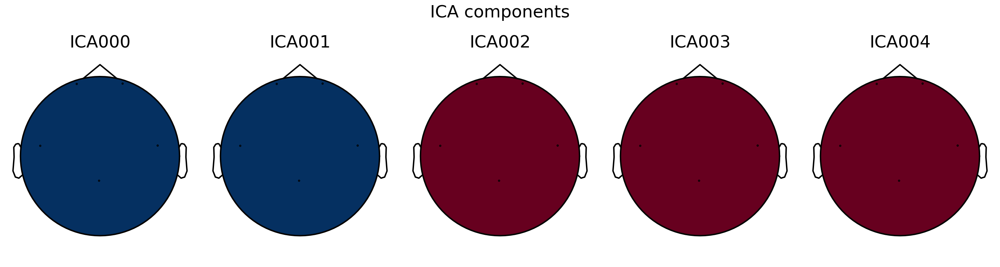

 001 (1)_raw_ica_components.png


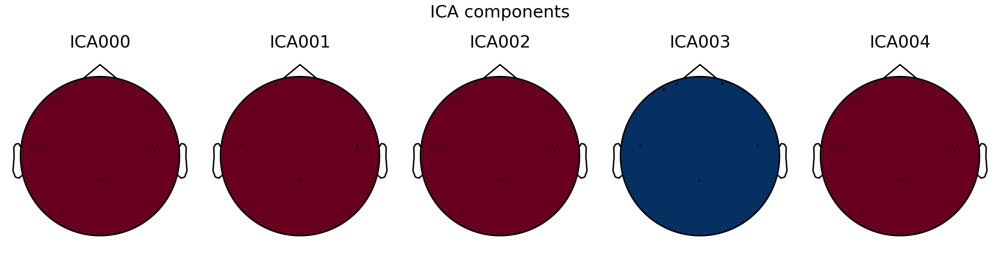

 001 (10)_filtered_ica_components.png


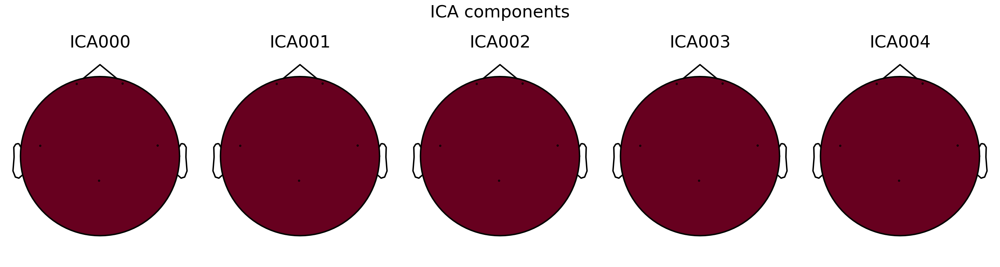

 001 (10)_raw_ica_components.png


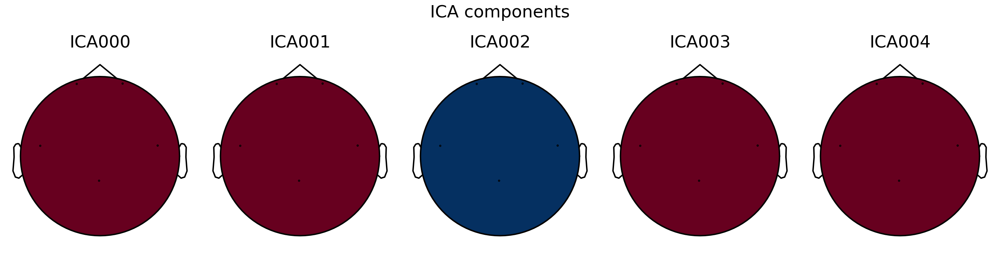

 001 (11)_filtered_ica_components.png


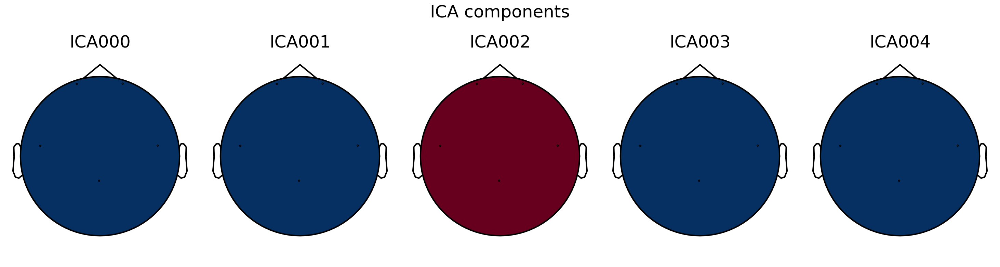

 001 (11)_raw_ica_components.png


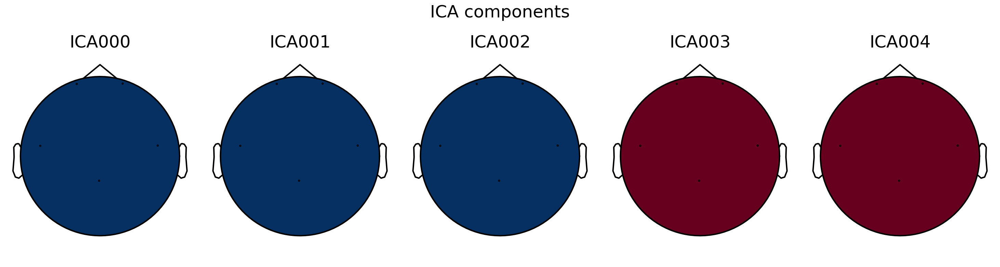

 001 (12)_filtered_ica_components.png


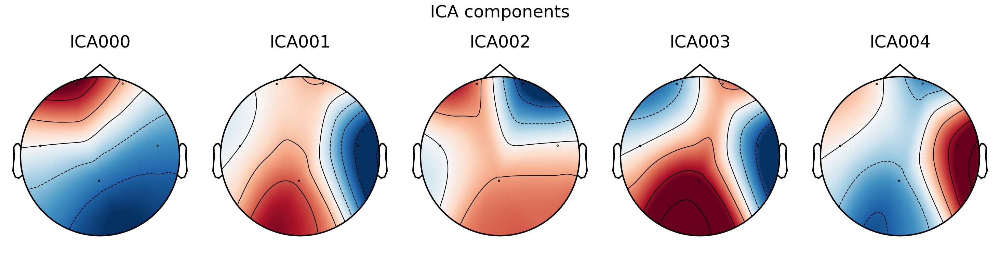

 001 (12)_raw_ica_components.png


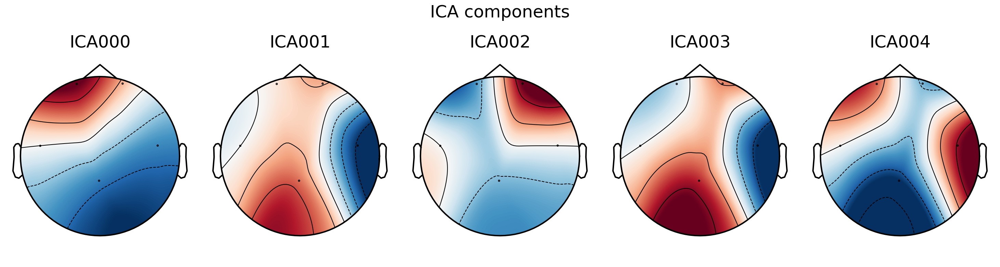

 001 (13)_filtered_ica_components.png


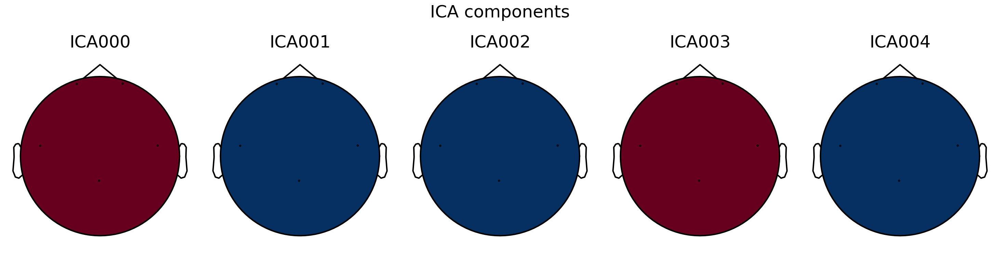

 001 (13)_raw_ica_components.png


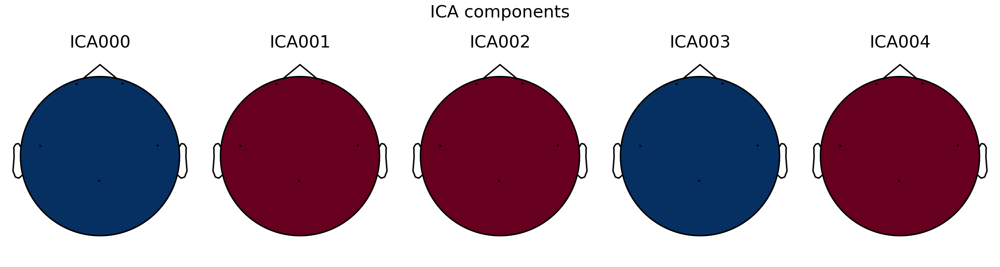

 001 (14)_filtered_ica_components.png


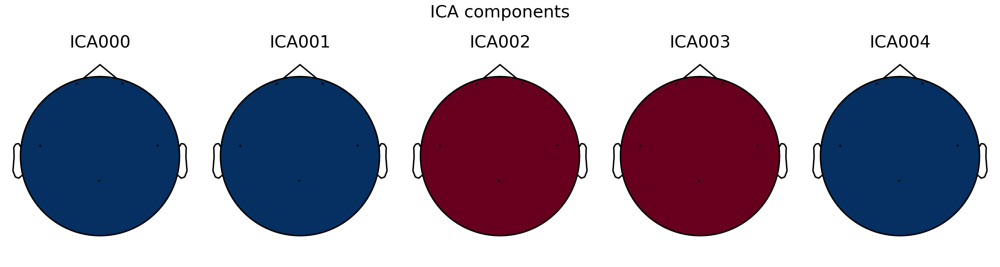

 001 (14)_raw_ica_components.png


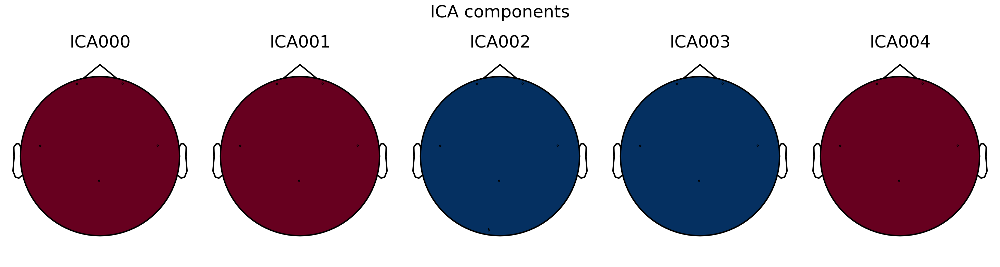

 001 (15)_filtered_ica_components.png


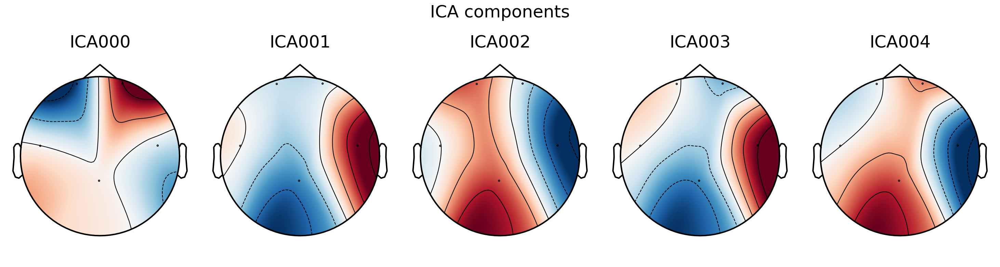

 001 (15)_raw_ica_components.png


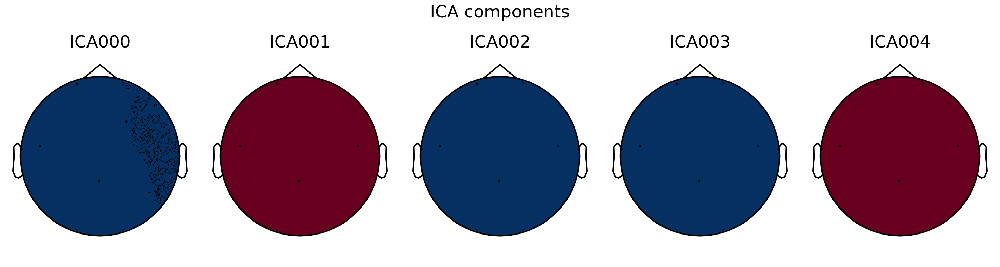

 001 (16)_filtered_ica_components.png


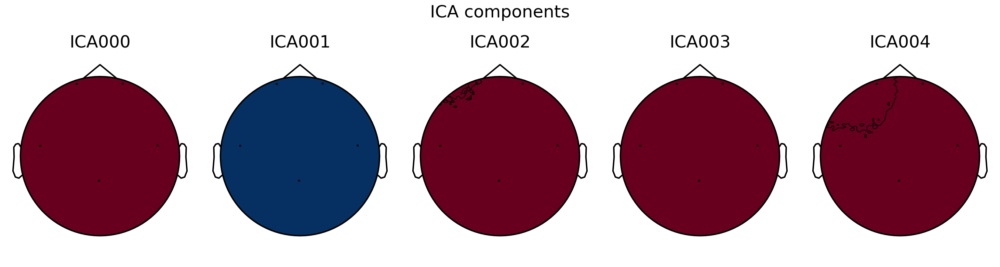

 001 (16)_raw_ica_components.png


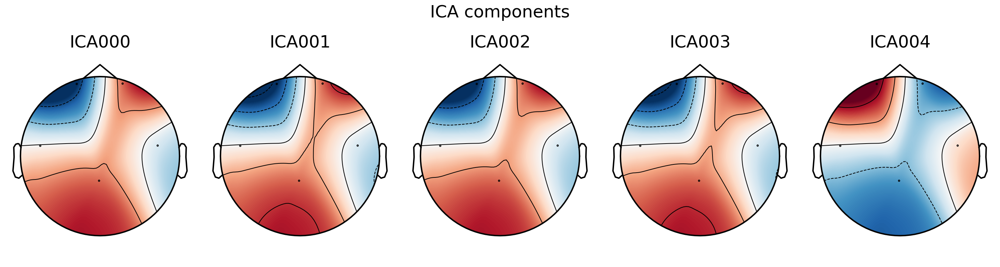

 001 (17)_filtered_ica_components.png


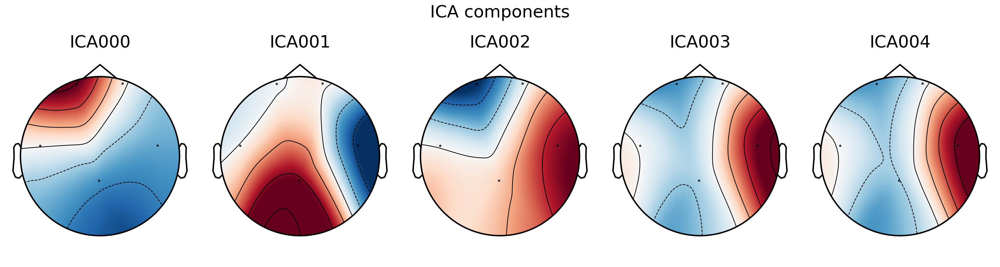

 001 (17)_raw_ica_components.png


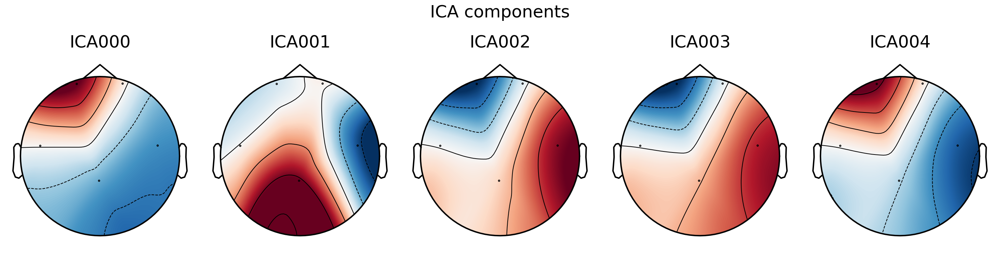

 001 (18)_filtered_ica_components.png


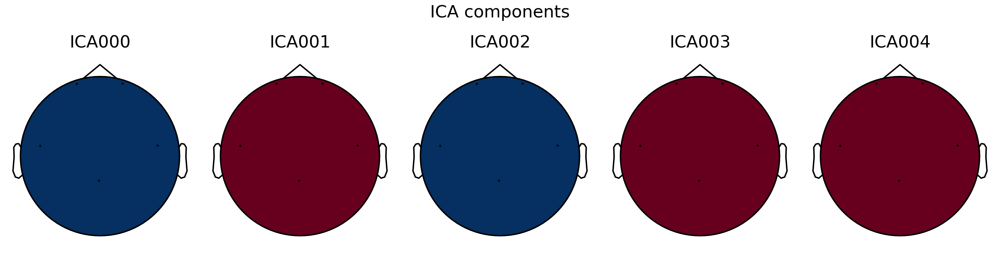

 001 (18)_raw_ica_components.png


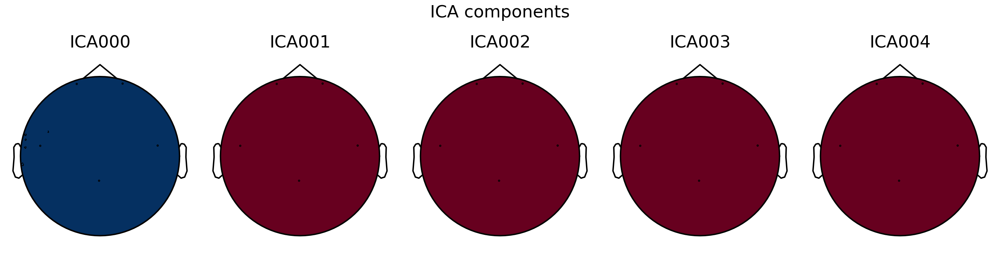

 001 (19)_filtered_ica_components.png


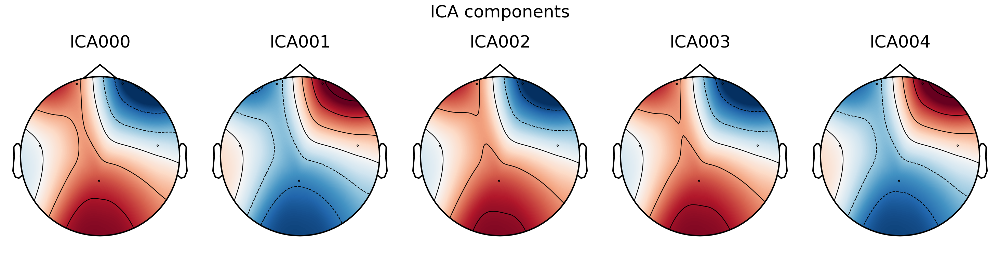

 001 (19)_raw_ica_components.png


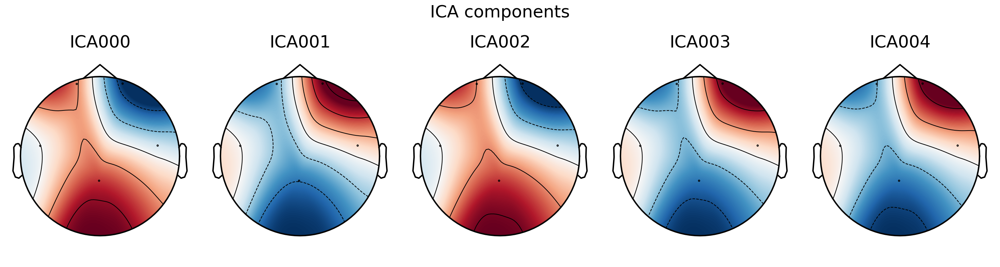

 001 (2)_filtered_ica_components.png


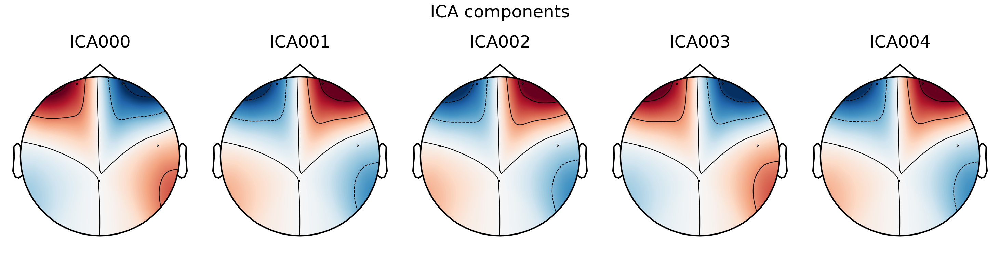

 001 (2)_raw_ica_components.png


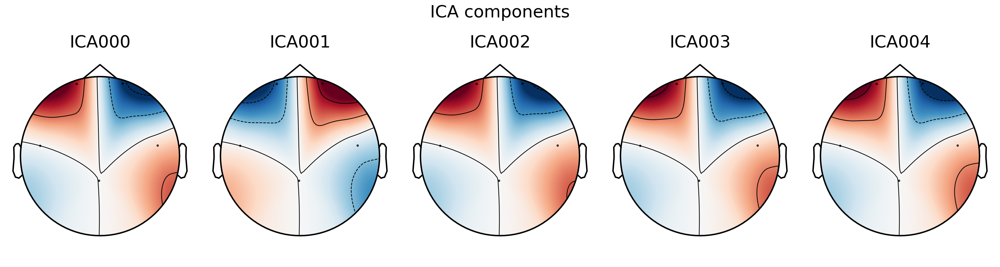

 001 (20)_filtered_ica_components.png


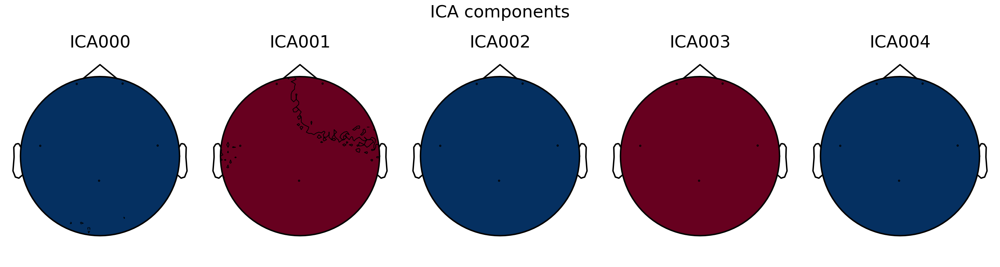

 001 (20)_raw_ica_components.png


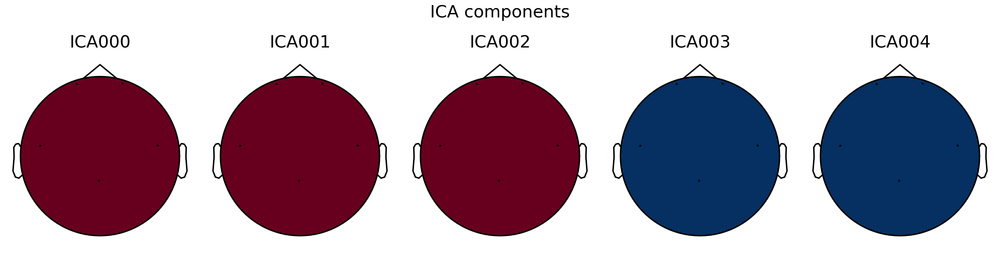

 001 (3)_filtered_ica_components.png


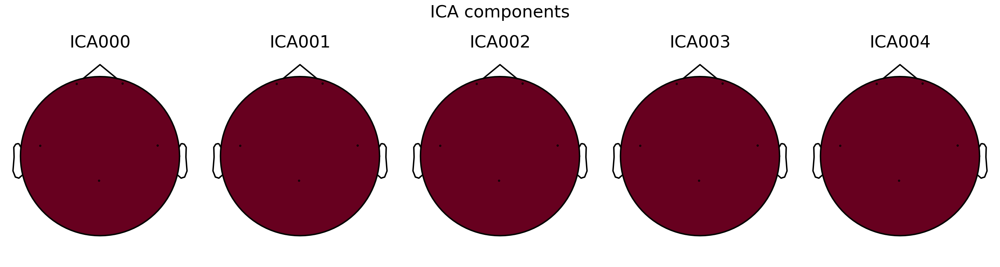

 001 (3)_raw_ica_components.png


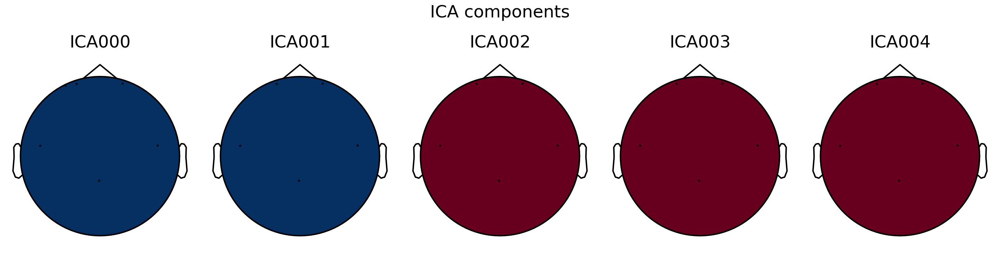

 001 (4)_filtered_ica_components.png


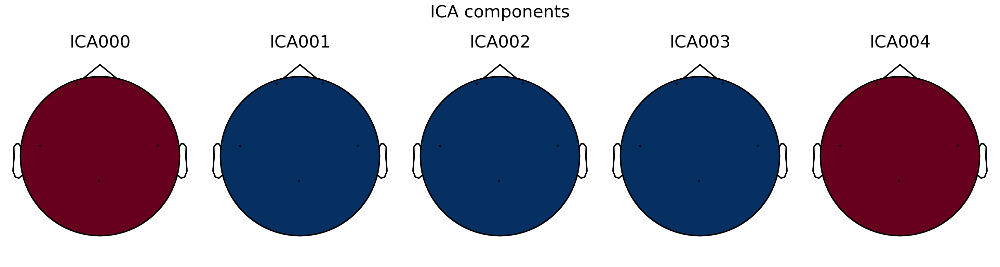

 001 (4)_raw_ica_components.png


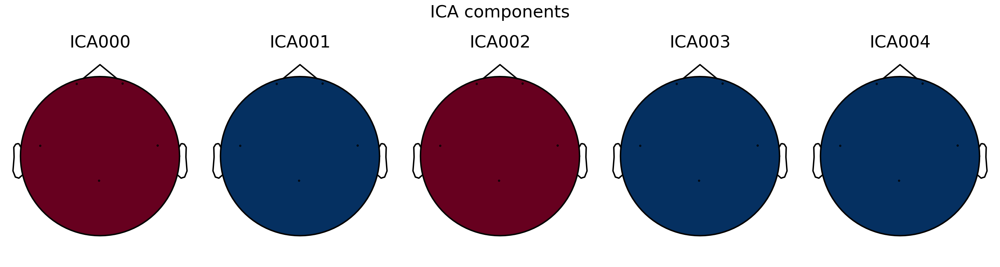

 001 (5)_filtered_ica_components.png


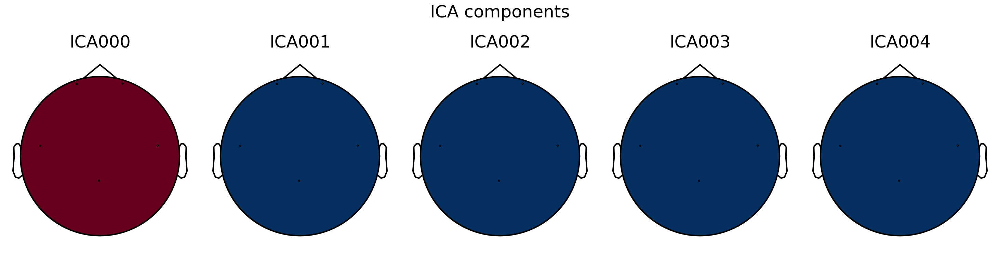

 001 (5)_raw_ica_components.png


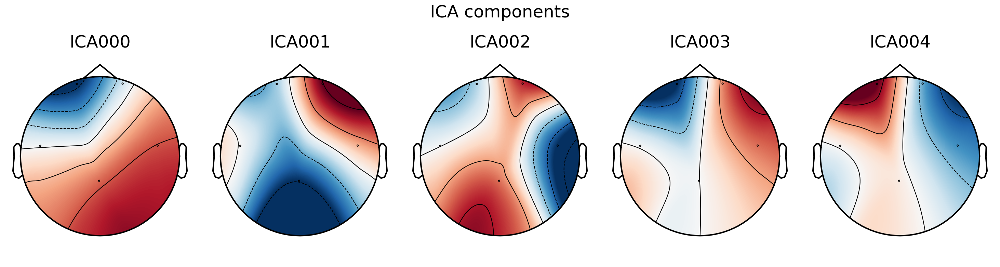

 001 (6)_filtered_ica_components.png


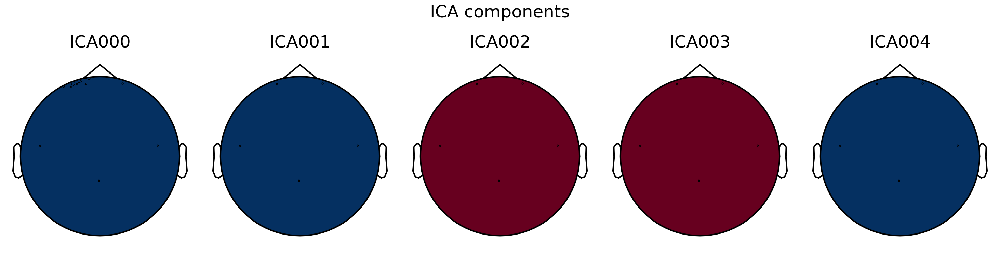

 001 (6)_raw_ica_components.png


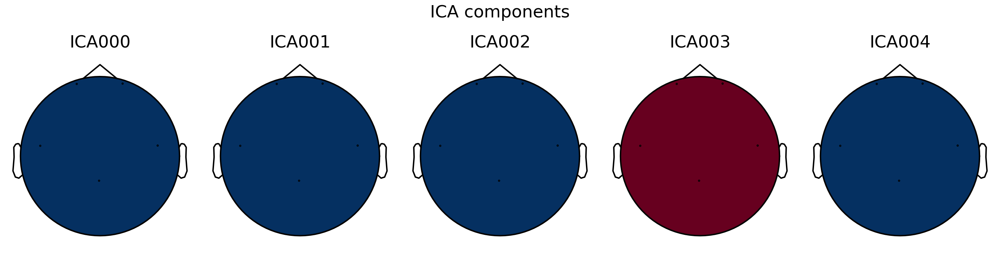

 001 (7)_filtered_ica_components.png


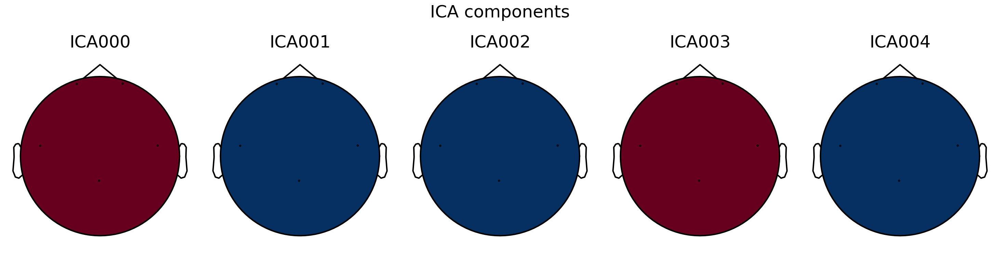

 001 (7)_raw_ica_components.png


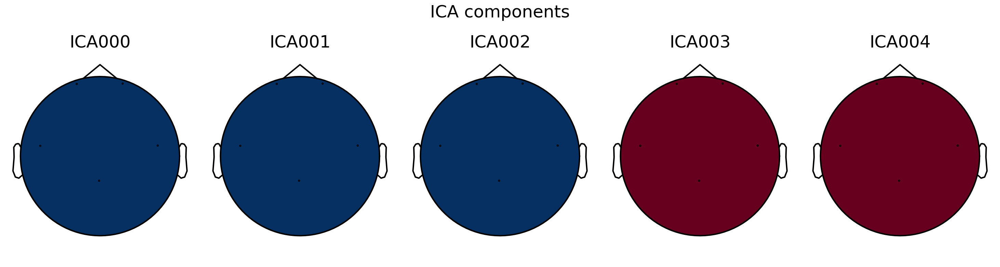

 001 (8)_filtered_ica_components.png


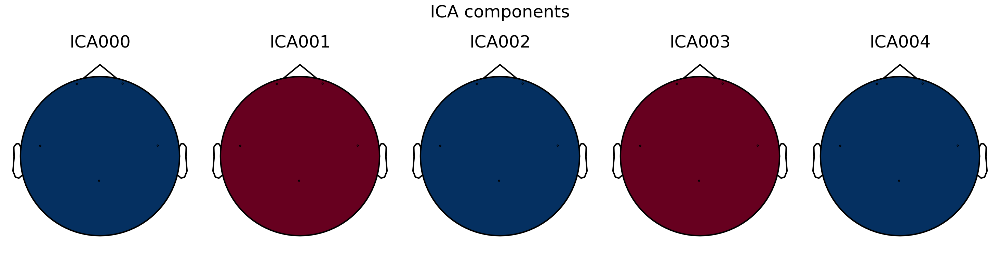

 001 (8)_raw_ica_components.png


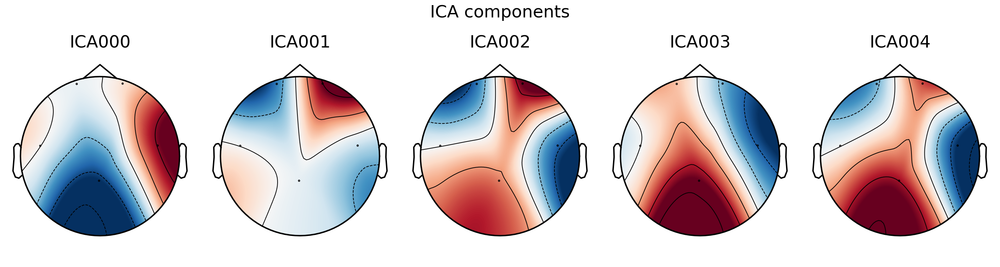

 001 (9)_filtered_ica_components.png


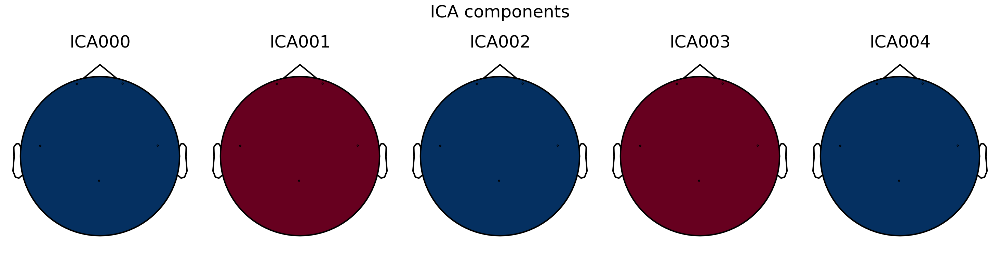

 001 (9)_raw_ica_components.png


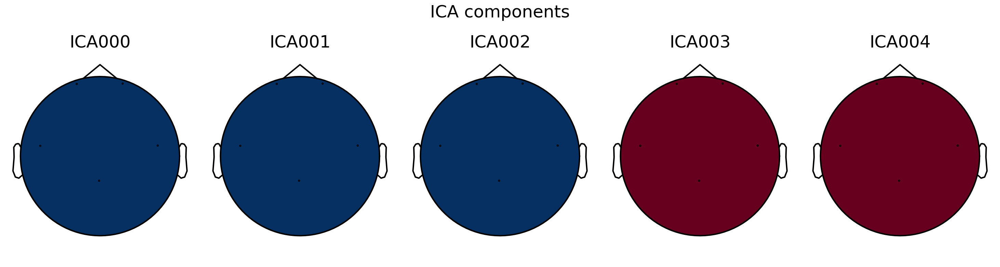

In [ ]:
# View image file names
import os
from IPython.display import Image, display

plot_dir = "/content/ica_plots"
files = sorted([f for f in os.listdir(plot_dir) if f.endswith(".png")])

# Display images inline
for fname in files:
    print(f" {fname}")
    display(Image(filename=os.path.join(plot_dir, fname)))

In [ ]:
from google.colab import files


# Save the DataFrame to CSV (if not already saved)
df.to_csv("iclabel_results.csv", index=False)



In [ ]:
df.to_csv("/content/iclabel_results.csv", index=False)


<ipython-input-6-68210329c427>:15: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_melted, x="ICLabel_Type", y="Count", hue="Version", ci=None)


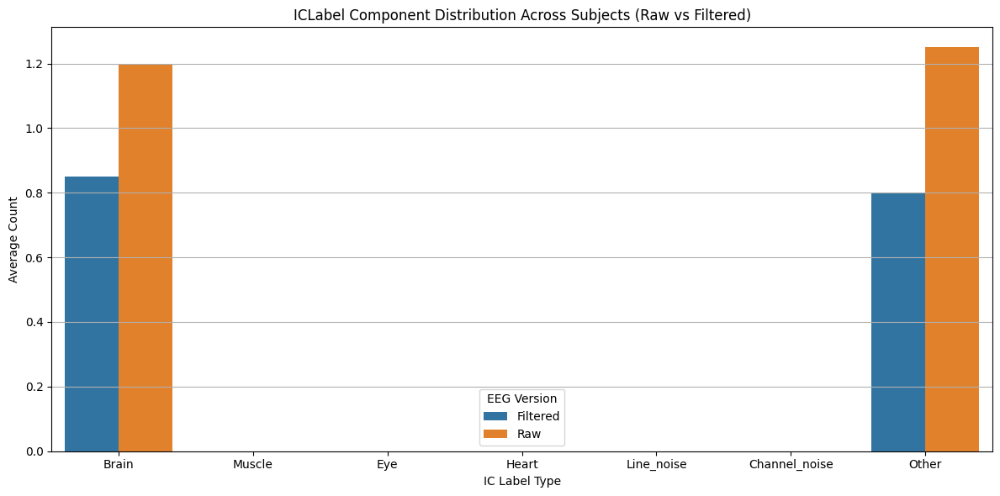

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the ICLabel results
df = pd.read_csv("iclabel_results.csv")

# Reshape for grouped plotting
df_melted = df.melt(id_vars=["Subject", "Version"],
                    value_vars=["Brain", "Muscle", "Eye", "Heart", "Line_noise", "Channel_noise", "Other"],
                    var_name="ICLabel_Type", value_name="Count")

# Plot comparison bar chart
plt.figure(figsize=(12, 6))
sns.barplot(data=df_melted, x="ICLabel_Type", y="Count", hue="Version", ci=None)

plt.title("ICLabel Component Distribution Across Subjects (Raw vs Filtered)")
plt.xlabel("IC Label Type")
plt.ylabel("Average Count")
plt.legend(title="EEG Version")
plt.grid(axis="y")
plt.tight_layout()
plt.show()

In [ ]:
# Epochs Generation

import numpy as np
# Step 0: Create events and epochs from raw_filt
events = mne.make_fixed_length_events(raw_filt, duration=1.0)
epochs = mne.Epochs(raw_filt, events, tmin=0, tmax=1.0, baseline=None, preload=True)

# Step 0b: Define binary labels (alternate 0, 1)
labels = np.array([0 if i % 2 == 0 else 1 for i in range(len(epochs))])

Not setting metadata
201 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 201 events and 129 original time points ...
1 bad epochs dropped


In [ ]:
# Feature Extraction

from mne.decoding import CSP
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import ShuffleSplit
import numpy as np

# --- Get data ---
X_filt = epochs.get_data()
y = np.array([0 if i % 2 == 0 else 1 for i in range(len(epochs))])

# --- Set up CSP and classifier ---
csp = CSP(n_components=2, reg=0.1, log=True, norm_trace=False)
lda = LinearDiscriminantAnalysis()
cv = ShuffleSplit(n_splits=10, test_size=0.2, random_state=42)

scores = []

for train_idx, test_idx in cv.split(X_filt):
    X_train, X_test = X_filt[train_idx], X_filt[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    if len(np.unique(y_train)) < 2:
        continue  # skip fold with only one class

    csp.fit(X_train, y_train)
    X_train_csp = csp.transform(X_train)
    X_test_csp = csp.transform(X_test)

    lda.fit(X_train_csp, y_train)
    score = lda.score(X_test_csp, y_test)
    scores.append(score)

print(f"Classification Accuracy: {np.mean(scores):.3f} ± {np.std(scores):.3f}")

Computing rank from data with rank=None
    Using tolerance 0.005 (2.2e-16 eps * 31 dim * 7.3e+11  max singular value)
    Estimated rank (data): 24
    data: rank 24 computed from 31 data channels with 0 projectors
    Setting small data eigenvalues to zero (without PCA)
Reducing data rank from 31 -> 24
Estimating class=0 covariance using SHRINKAGE
Done.
Estimating class=1 covariance using SHRINKAGE
Done.
Computing rank from data with rank=None
    Using tolerance 0.005 (2.2e-16 eps * 31 dim * 7.3e+11  max singular value)
    Estimated rank (data): 24
    data: rank 24 computed from 31 data channels with 0 projectors
    Setting small data eigenvalues to zero (without PCA)
Reducing data rank from 31 -> 24
Estimating class=0 covariance using SHRINKAGE
Done.
Estimating class=1 covariance using SHRINKAGE
Done.
Computing rank from data with rank=None
    Using tolerance 0.005 (2.2e-16 eps * 31 dim * 7.3e+11  max singular value)
    Estimated rank (data): 24
    data: rank 24 computed from

Computing rank from data with rank=None
    Using tolerance 0.0056 (2.2e-16 eps * 31 dim * 8.1e+11  max singular value)
    Estimated rank (data): 24
    data: rank 24 computed from 31 data channels with 0 projectors
    Setting small data eigenvalues to zero (without PCA)
Reducing data rank from 31 -> 24
Estimating class=0 covariance using SHRINKAGE
Done.
Estimating class=1 covariance using SHRINKAGE
Done.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Computing rank from data with rank=None
    Using tolerance 6.5e-05 (2.2e-16 eps * 5 dim * 5.8e+10  max singular value)
    Estimated rank (data): 5
    data: rank 5 computed from 5 data channels with 0 projectors
Reducing data rank from 5 -> 5
Estimating class=0 covariance using SHRINKAGE
Done.
Estimating class=1 covariance using SHRINKAGE
Done.


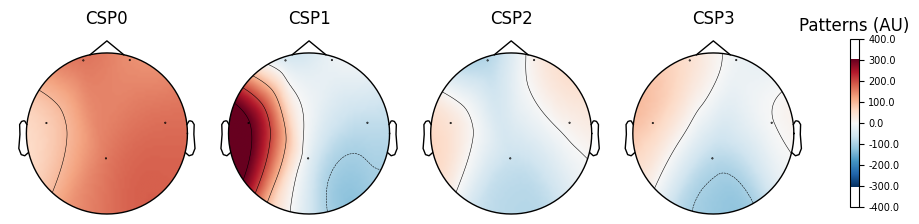

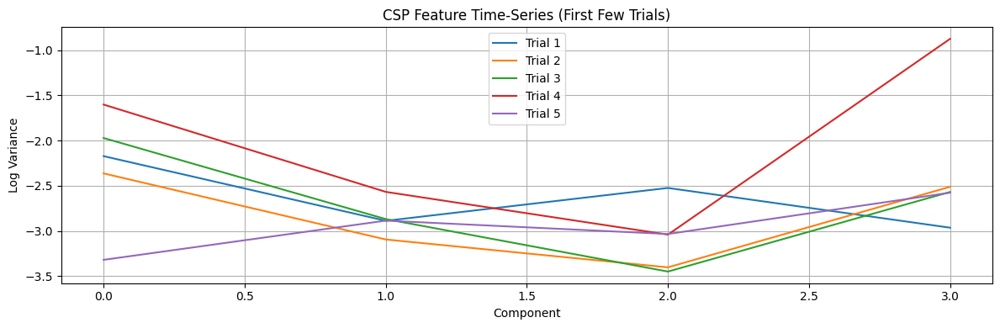

In [ ]:
# === Fit CSP on full filtered data ===
csp.fit(X_filt, y)

# Define valid EEG channels
eeg_chs = ['AF3', 'AF4', 'T7', 'T8', 'Pz']

# Select EEG channels and set standard locations
epochs_eeg = epochs.copy().pick_channels(eeg_chs)
epochs_eeg.set_montage('standard_1020')

# Get EEG-only data
X_eeg = epochs_eeg.get_data()
y = labels  # Already defined

# Fit CSP only on EEG data
from mne.decoding import CSP
csp = CSP(n_components=4, reg=0.1, log=True, norm_trace=False)
csp.fit(X_eeg, y)

# Plot CSP patterns (EEG-matching)
fig_topo = csp.plot_patterns(epochs_eeg.info, ch_type='eeg', units='Patterns (AU)', size=1.5)
fig_topo.savefig("csp_topomaps.png", dpi=300)

# === 2. Plot CSP Feature Time-Series ===
X_csp_all = csp.transform(X_eeg)  # <-- Use X_eeg not X_filt

import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
for i in range(min(5, len(X_csp_all))):
    plt.plot(X_csp_all[i, :], label=f"Trial {i+1}")
plt.title("CSP Feature Time-Series (First Few Trials)")
plt.xlabel("Component")
plt.ylabel("Log Variance")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("csp_feature_timeseries.png", dpi=300)
plt.show()

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 423 samples (3.305 s)

Not setting metadata
100 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated
Using data from preloaded Raw for 100 events and 513 original time points ...
0 bad epochs dropped
Computing rank from data with rank=None
    Using tolerance 1.5e-05 (2.2e-16 eps * 5 dim * 1.4e+10  max s

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


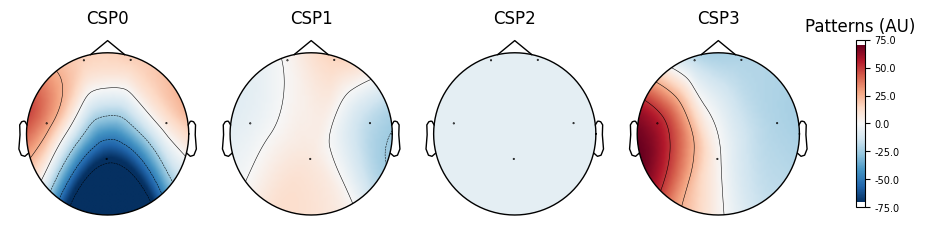

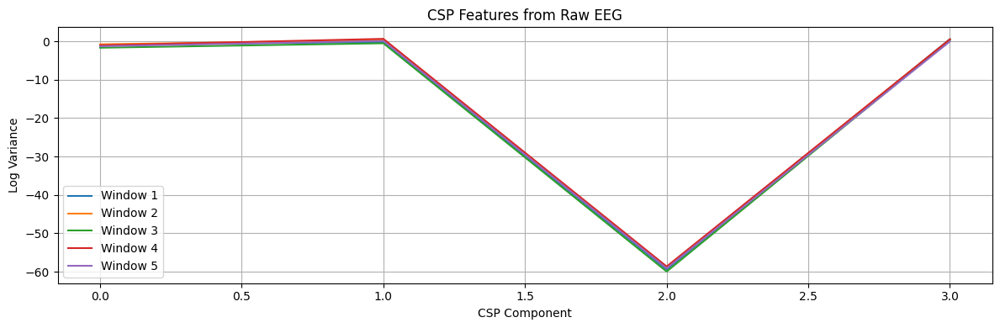

In [ ]:
import mne
import numpy as np
from mne.decoding import CSP
import matplotlib.pyplot as plt

# --- Step 1: Select EEG channels and set montage ---
eeg_chs = ['AF3', 'AF4', 'T7', 'T8', 'Pz']
raw_eeg = raw.copy().pick_channels(eeg_chs)
raw_eeg.set_montage('standard_1020')

# --- Step 2: Bandpass filter frequencies ---
raw_eeg.filter(1., 30., fir_design='firwin')

# --- Step 3: Define events manually
duration = 4.0
sfreq = raw_eeg.info['sfreq']
n_samples = len(raw_eeg.times)
n_windows = int(np.floor(raw_eeg.times[-1] / duration))

events = []
labels = []
for i in range(n_windows):
    start_sample = int(i * duration * sfreq)
    events.append([start_sample, 0, 1 if i % 2 == 0 else 2])  # alternate classes 1 and 2
    labels.append(0 if i % 2 == 0 else 1)  # 0 = class 1, 1 = class 2

events = np.array(events)

# --- Step 4: Create epochs from raw data ---
epochs = mne.Epochs(raw_eeg, events, event_id={'class1': 1, 'class2': 2},
                    tmin=0, tmax=duration, baseline=None, preload=True)

X = epochs.get_data()
y = np.array(labels)

# --- Step 5: Fit CSP and visualize ---
csp = CSP(n_components=4, reg=0.1, log=True, norm_trace=False)
csp.fit(X, y)

# --- Step 6: Plot CSP Topomaps ---
fig_topo = csp.plot_patterns(epochs.info, ch_type='eeg', units='Patterns (AU)', size=1.5)
fig_topo.savefig("csp_topomap_from_raw.png", dpi=300)

# --- Step 7: Plot CSP Features ---
X_csp = csp.transform(X)
plt.figure(figsize=(12, 4))
for i in range(min(5, len(X_csp))):
    plt.plot(X_csp[i, :], label=f"Window {i+1}")
plt.title("CSP Features from Raw EEG")
plt.xlabel("CSP Component")
plt.ylabel("Log Variance")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("csp_features_from_raw.png", dpi=300)
plt.show()